# Find the optimum Rotation of CTIO Data in November 2016
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : December 9th 2016

The goal is to rotate the image correctly

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [2]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [3]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [4]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [5]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [6]:
%load_ext Cython

In [7]:
from IPython.display import Image, display

In [8]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [9]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [10]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [11]:
inputdir="./cut_fitsimages"
object_name='HD14943'

In [134]:
#outputdir="./spectrum_fitsimages"
outputdir="./rotated_fitsimages"

In [137]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [14]:
input_filelist=os.listdir(inputdir) 

In [15]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [16]:
#print input_filelist

In [17]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [18]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    index=0

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                index=index+1
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

In [19]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [20]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [21]:
print indexes_files

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117]


In [22]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [23]:
sorted_numbers=indexes_files[sorted_indexes]

In [24]:
print sorted_indexes

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]


In [25]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [26]:
#sorted_files

## Build full filename
----------------------------

In [27]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [28]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [29]:
print sorted_filenames.shape

(117,)


## Acces to data of  images
----------------------------------

In [30]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []

In [31]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo

In [32]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [33]:
len(all_images)

117

In [34]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowImages(all_images,all_titles,object_name):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=50)
        axarr[iy,ix].set_title(all_titles[index])
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)
    return thex0

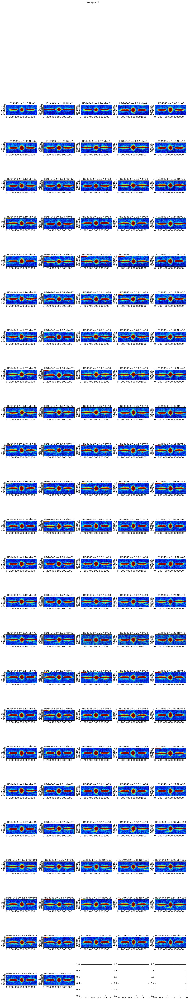

In [35]:
thex0=ShowImages(all_images,all_titles,object_name)

### Shows the transverse profile

In [36]:
DeltaX=600
w=20
ws=80

In [37]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowTransverseProfile(all_images,all_titles,object_name,all_expo):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    return thespectra,they0

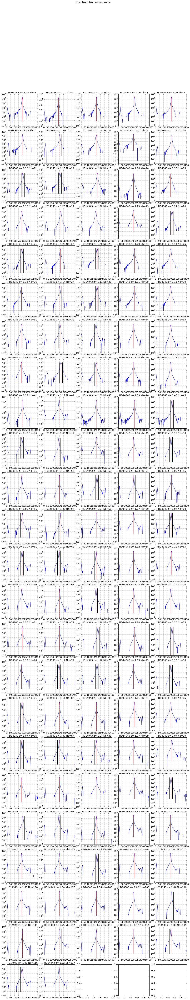

In [38]:
thespectra,they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo)

In [39]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowSpectrumProfile(spectra,all_titles,object_name):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    plt.suptitle(title,size=16)

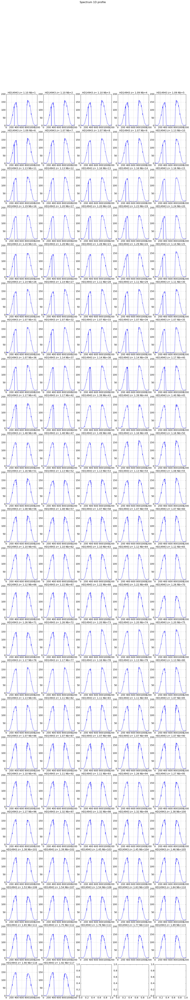

In [40]:
ShowSpectrumProfile(thespectra,all_titles,object_name)

In [41]:
print they0

[200, 186, 198, 209, 201, 206, 203, 194, 193, 205, 208, 206, 208, 194, 190, 193, 216, 188, 192, 211, 195, 212, 205, 205, 194, 190, 204, 205, 207, 194, 192, 208, 191, 195, 194, 188, 219, 193, 195, 193, 204, 196, 196, 207, 209, 195, 191, 196, 196, 196, 194, 198, 202, 198, 203, 199, 208, 195, 196, 197, 196, 194, 192, 194, 201, 194, 202, 189, 195, 194, 201, 199, 216, 208, 210, 190, 194, 204, 194, 196, 197, 201, 197, 204, 194, 195, 195, 192, 195, 206, 189, 200, 199, 205, 197, 207, 191, 193, 193, 191, 192, 197, 202, 203, 193, 193, 202, 197, 197, 208, 203, 203, 196, 196, 198, 199, 196]


In [42]:
print thex0

[607, 600, 598, 602, 605, 605, 604, 596, 603, 604, 598, 605, 598, 596, 597, 597, 603, 598, 595, 598, 596, 603, 605, 605, 596, 598, 605, 604, 596, 604, 597, 596, 598, 596, 594, 598, 599, 596, 597, 595, 604, 597, 597, 604, 598, 597, 599, 596, 598, 598, 599, 604, 605, 604, 603, 604, 600, 599, 598, 597, 596, 598, 605, 598, 605, 598, 604, 604, 598, 598, 604, 604, 599, 603, 603, 603, 597, 605, 597, 596, 596, 604, 597, 603, 602, 598, 598, 602, 598, 602, 602, 604, 604, 597, 597, 595, 602, 599, 603, 602, 603, 597, 605, 598, 603, 599, 605, 598, 597, 599, 605, 605, 599, 604, 598, 597, 598]


### Test rotation optimum
----------------------------

In [43]:
from scipy import stats 
from scipy import ndimage
from scipy.optimize import curve_fit

In [44]:
sel=0

In [45]:
image_sel=np.copy(all_images[sel])
y0=they0[sel]
x0=thex0[sel]

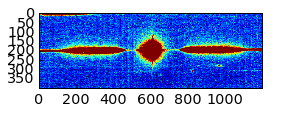

In [46]:
plt.imshow(image_sel,vmin=-10,vmax=50)

In [47]:
region=np.copy(image_sel[y0-100:y0+100,x0-500:x0+500])
#region[:,500-100:500+100]=0
data=np.copy(region)

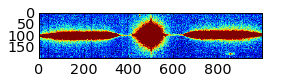

In [48]:
plt.imshow(data,vmin=-10,vmax=50)

### find the orientation by the average

In [49]:
def ComputeMedY(data):
    """
    Compute the median of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_medianY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_medianY[ix]=med
    return the_medianY

In [50]:
def ComputeAveY(data):
    """
    Compute the average of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_averY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_averY[ix]=med
    return the_averY

In [51]:

xindex=np.arange(data.shape[1])

In [62]:
selected_indexes=np.where(np.logical_or(xindex<340,xindex>660))

In [76]:
yaver=ComputeAveY(data)

In [77]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

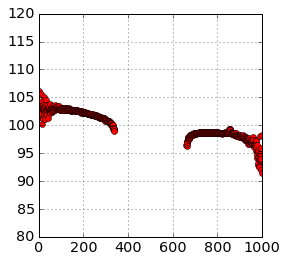

In [78]:
plt.plot(XtoFit,YtoFit,'ro')
plt.ylim(80,120)
plt.grid(True)

In [79]:
def fit_func(x, a, b):
    return a*x + b

In [67]:
from scipy.optimize import curve_fit
   

In [80]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [81]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

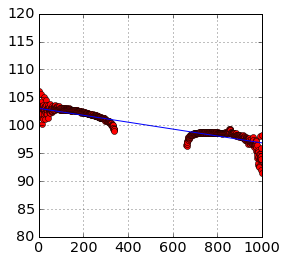

In [82]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

In [71]:
print a,b

-0.00618643819229 103.018239433


In [74]:
print np.arctan(a)*180/np.pi

-0.354452276815


## Find Rotation angle for each image
----------------------------------------------

In [97]:
def ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name):
    """
    ComputeRotationAnge
    ===================
    
    input:
    ------
    all_images
    thex0
    they0
    
    
    output:
    ------
    param_a
    param_b
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    param_a=np.zeros(NBIMAGES)
    param_b=np.zeros(NBIMAGES)

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        
        image_sel=np.copy(image)
        y0=they0[index]
        x0=thex0[index]
        
        # extract a region of 200 x 1000 centered at y=100,x=500
        
        region=np.copy(image_sel[y0-100:y0+100,x0-500:x0+500])
        data=np.copy(region)
        
        xindex=np.arange(data.shape[1])
        selected_indexes=np.where(np.logical_or(xindex<340,xindex>660))
        # compute Y vs X
        yaver=ComputeAveY(data)
        
        XtoFit=xindex[selected_indexes]
        YtoFit=yaver[selected_indexes]
        # does the fit
        params = curve_fit(fit_func, XtoFit, YtoFit)
        [a, b] = params[0]
        
        param_a[index]=a
        param_b[index]=b
        
        print index,' y = ',a,' * x + ',b
        x_new = np.linspace(xindex.min(),xindex.max(), 50)
        y_new = fit_func(x_new,a,b)
    
        im=axarr[iy,ix].plot(XtoFit,YtoFit,'ro')
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_ylim(80,120)
        axarr[iy,ix].grid(True)
        
    title='Fit rotation angle of '.format(object_name)    
    plt.suptitle(title,size=16)
    return param_a,param_b
    
    

0  y =  -0.00618643819229  * x +  103.018239433
1  y =  -0.00690778464799  * x +  104.478037602
2  y =  -0.00637722439651  * x +  103.750136027
3  y =  -0.00641598089673  * x +  103.406285857
4  y =  -0.00607078520701  * x +  103.340199163
5  y =  -0.00625823017022  * x +  104.056217724
6  y =  -0.00618671292762  * x +  103.212597483
7  y =  -0.00631319091  * x +  102.691856967
8  y =  -0.00626909785633  * x +  103.03741099
9  y =  -0.00610710297878  * x +  103.664252049
10  y =  -0.00621909917639  * x +  103.066927852
11  y =  -0.00597430486097  * x +  102.69449198
12  y =  -0.00606426565023  * x +  103.545184295
13  y =  -0.00591441464613  * x +  102.758493223
14  y =  -0.00601208540364  * x +  103.187109454
15  y =  -0.00618394016924  * x +  103.743048671
16  y =  -0.00613978143871  * x +  103.579956991
17  y =  -0.00624657740326  * x +  103.271025967
18  y =  -0.00652567572166  * x +  103.863256486
19  y =  -0.00624779683695  * x +  103.621523765
20  y =  -0.0063484999647  * x +  1

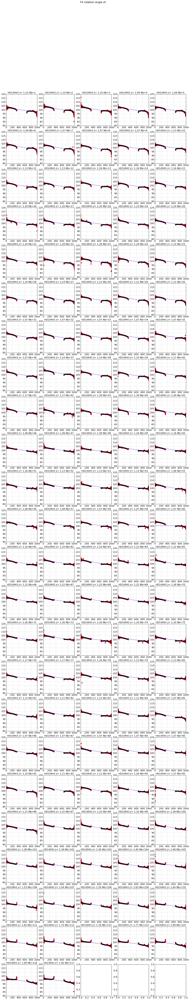

In [98]:
all_a,all_b=ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name)

In [106]:
all_angles=all_a*180./np.pi

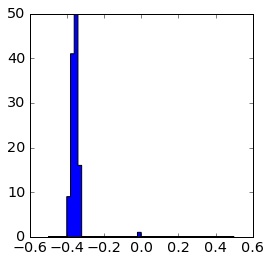

In [107]:
#hist(x, bins=10, range=None, normed=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, hold=None, data=None, **kwargs)
n, bins, patches=plt.hist(all_angles,bins=50,range=[-.5,.5],histtype='stepfilled')

## Now turn the images accordingly

In [113]:
def TurnTheImages(all_images,all_angles,all_titles,object_name):
    """
    TurnTheImages
    =============
    
    input:
    ------
    all_images:
    all_angles:
    
    
    output:
    ------
    all_rotated_images
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    all_rotated_images = []

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        angle=all_angles[index]    
        data=np.copy(image)
        
        rotated_image=ndimage.interpolation.rotate(data,angle)
        
        all_rotated_images.append(rotated_image)
        
        im=axarr[iy,ix].imshow(rotated_image,vmin=0,vmax=50)
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        
        axarr[iy,ix].grid(True)
        
    title='Rotated images for '.format(object_name)    
    plt.suptitle(title,size=16)
    return all_rotated_images

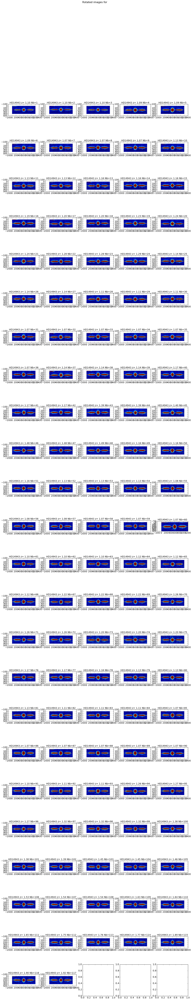

In [114]:
turned_images=TurnTheImages(all_images,all_angles,all_titles,object_name)

## Check rotation

In [116]:
sel=0

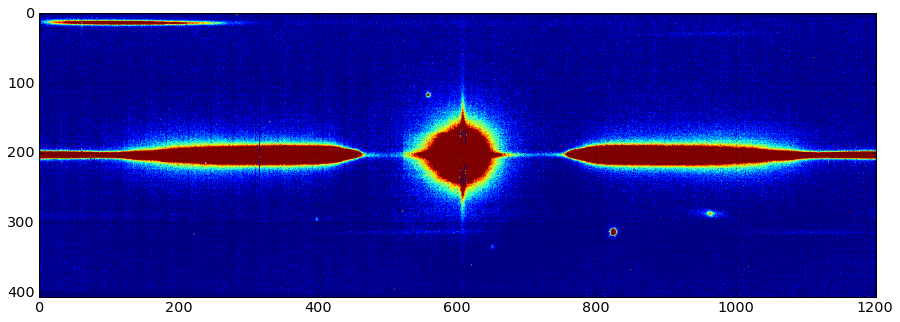

In [122]:
plt.figure(figsize=(15,10))
plt.imshow(turned_images[sel],vmin=0,vmax=100)
plt.grid(True)

In [123]:
image_sel=np.copy(turned_images[sel])
y0=they0[sel]
x0=thex0[sel]

In [124]:
region=np.copy(image_sel[y0-100:y0+100,x0-500:x0+500])
#region[:,500-100:500+100]=0
data=np.copy(region)

In [125]:
xindex=np.arange(data.shape[1])

In [126]:
selected_indexes=np.where(np.logical_or(xindex<340,xindex>660))

In [127]:
yaver=ComputeAveY(data)

In [128]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

In [129]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [130]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

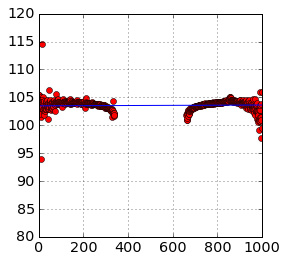

In [131]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

### prepare outputfilename

In [135]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [136]:
newfullfilenames

['./rotated_fitsimages/rotimg_HD14943_2016_11_23T01_45_51_1.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T01_46_55_2.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T01_47_58_3.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T01_52_42_4.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T01_54_05_5.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T01_55_29_6.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T02_27_22_7.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T02_28_46_8.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T02_30_09_9.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_36_28_10.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_37_52_11.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_39_16_12.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_55_21_13.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_56_44_14.fits',
 './rotated_fitsimages/rotimg_HD14943_2016_11_23T04_58_08

### Save outputfilename

In [138]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=turned_images[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)

In [ ]:
!ls

In [ ]:
# !ls -l cut_fitsimages